# scRNA-seq analysis for CellOracle using ScanPy
**Authorship:** Adam Klie (last updated: 08/03/2023)<br>
***
**Description:** This notebook preprocesses the scRNA-seq part of the multi-seq for CellOracle using only ScanPy
***

# Set-up

In [27]:
# Imports
import os
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from ipywidgets import interactive

import scanpy as sc
import scanpy.external as sce
sc.settings.verbosity = 3
random_state = 13

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["figure.figsize"] = [6, 4.5]

In [ ]:
# Compute environment and versions
print("Python version: {}".format(sys.version))
print("pandas version: {}".format(pd.__version__))
print("numpy version: {}".format(np.__version__))
print("scanpy version: {}".format(sc.__version__))
print("seaborn version: {}".format(sns.__version__))
print("ipywidgets version: {}".format(interactive.__version__))
print("scanpy external version: {}".format(sce.__version__))

In [28]:
# TODO: change to relative path based on your dataset
h5ad_dir = "/cellar/users/aklie/data/igvf/topic_grn_links/h5ad"
results_dir = "/cellar/users/aklie/projects/igvf/topic_grn_links/grn_inference/celloracle/results"
dataset_name = "CharacterizationMcGinnis_Dataset6"

# Load AnnData object
Generated from combining h5 files in `data_wrangling.ipynb`

In [31]:
# Name of the h5ad file
h5ad_file = "adata_rna_merged.h5ad"

In [32]:
# Load using scanpy
adata = sc.read_h5ad(os.path.join(h5ad_dir, dataset_name, h5ad_file))
adata

AnnData object with n_obs × n_vars = 112128 × 31128
    obs: 'n_genes', 'total_counts', 'duplicate_counts', 'umis', 'genes', 'percent_mitochondrial', 'lane', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.25', 'seurat_clusters', 'PercentMito', 'lane_processded_metadata', 'MULTI', 'RNA_snn_res.1', 'RNA_snn_res.0.5', 'sample', 'temp'
    var: 'gene_ids', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'n_cells-4'

# QC

## Combinomics QCs
These are qc metrics caclulated by the BROAD Combinomics pipeline: https://docs.google.com/presentation/d/1TbIjyVU60mbg-rL8Y7mGiRjvf_7sjTGlrjMMG3i9Cig/edit#slide=id.g255fe6476ff_0_850:

I need to verify all of these
```
'barcode' - cell barcode
'total_counts' - total number of reads
'duplicate_counts' - number of duplicate reads
'umis' - number of unique molecular identifiers
'genes' - number of genes with nonzero counts
'percent_mitochondrial` - percent of reads mapping to mitochondrial genes
```

I also added metadata from Synapse which I'm guessing was from Chris McGinnis' previous analysis (maybe using CellRanger?):

I need to verify all of these

```
'orig.ident' - Seurat label
'nCount_RNA' - total number of ...
'nFeature_RNA' - number of genes with nonzero counts
'RNA_snn_res.0.25' - don't know
'seurat_clusters' - default Seurat cluster number
'PercentMito' - percent of reads mapping to mitochondrial genes
'lane_processded_metadata' - lane number (1-4)
'MULTI' - don't know: 
'RNA_snn_res.1' - don't know
'RNA_snn_res.0.5' - don't know
'sample' - sample number indicating stage of differentiation sampled at
'temp' - don't know
```

In [35]:
adata.obs = adata.obs.rename(columns={
    'total_counts': 'total_counts_combinomics', 
    'duplicate_counts': 'duplicate_counts_combinomics',
    'umis': 'umis_combinomics',
    'genes': 'genes_combinomics',
    'percent_mitochondrial': 'percent_mitochondrial_combinomics'
})

In [37]:
# Calculate a set basic QCs such as number of observed genes and mitochondrial gene fraction
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

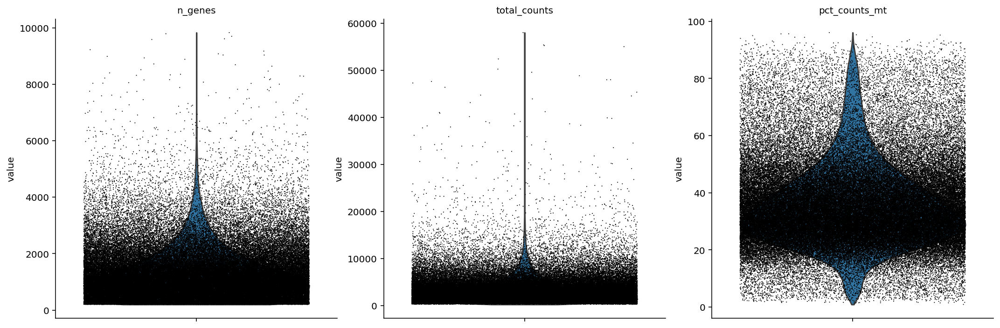

In [41]:
# Classic 3 violin plots
sc.pl.violin(adata, ['n_genes', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)

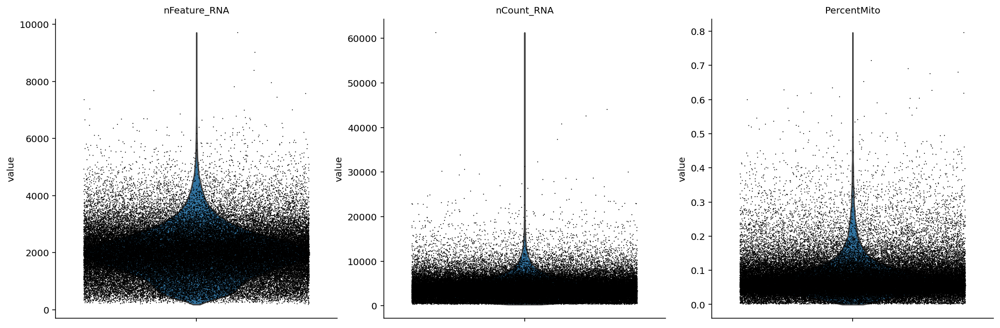

In [43]:
# Classic 3 violin plots from Chris's Seurat analysis
sc.pl.violin(adata, ['nFeature_RNA', 'nCount_RNA', 'PercentMito'], jitter=0.4, multi_panel=True)

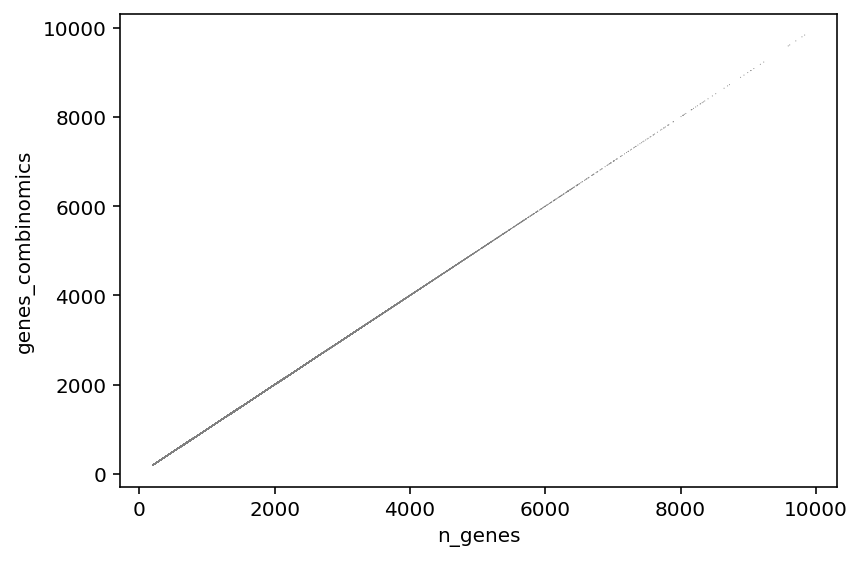

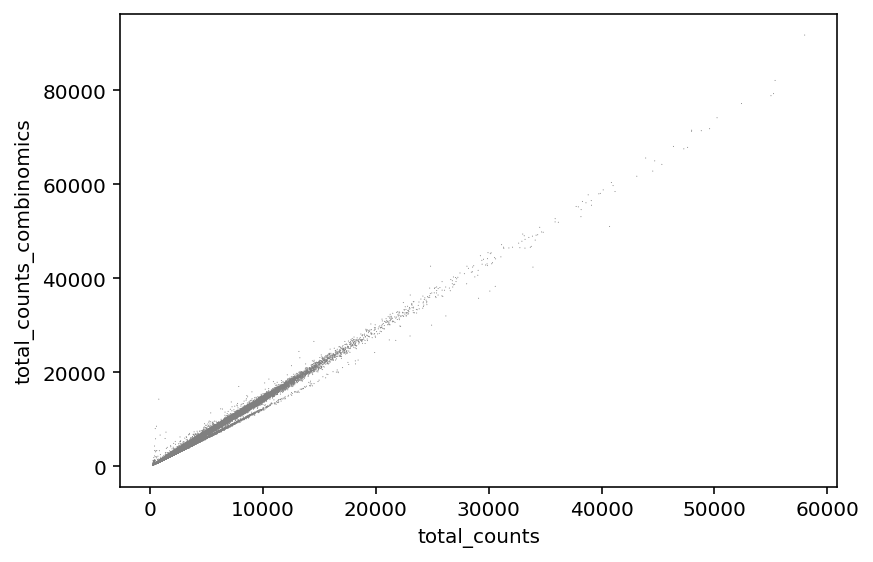

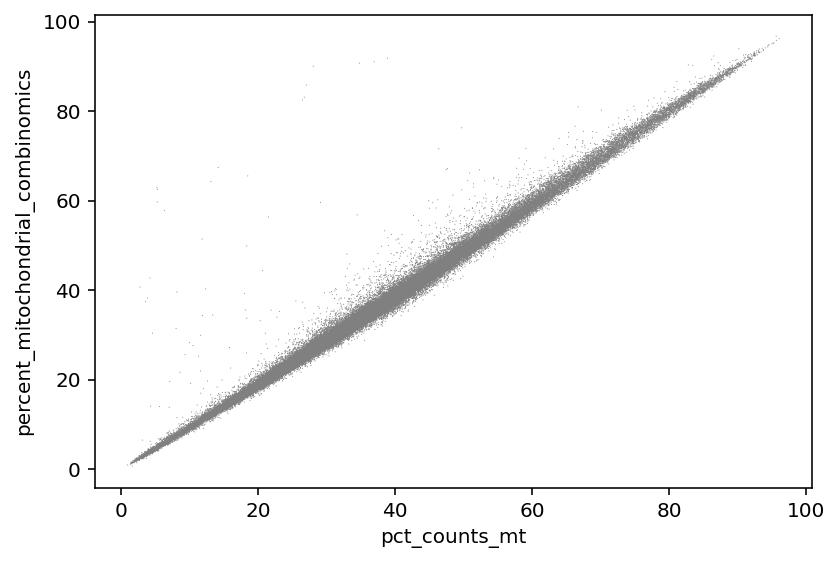

In [46]:
# Couple of scatters to compare scanpy and combinomics results
sc.pl.scatter(adata, x='n_genes', y='genes_combinomics')
sc.pl.scatter(adata, x='total_counts', y='total_counts_combinomics')
sc.pl.scatter(adata, x='pct_counts_mt', y='percent_mitochondrial_combinomics')

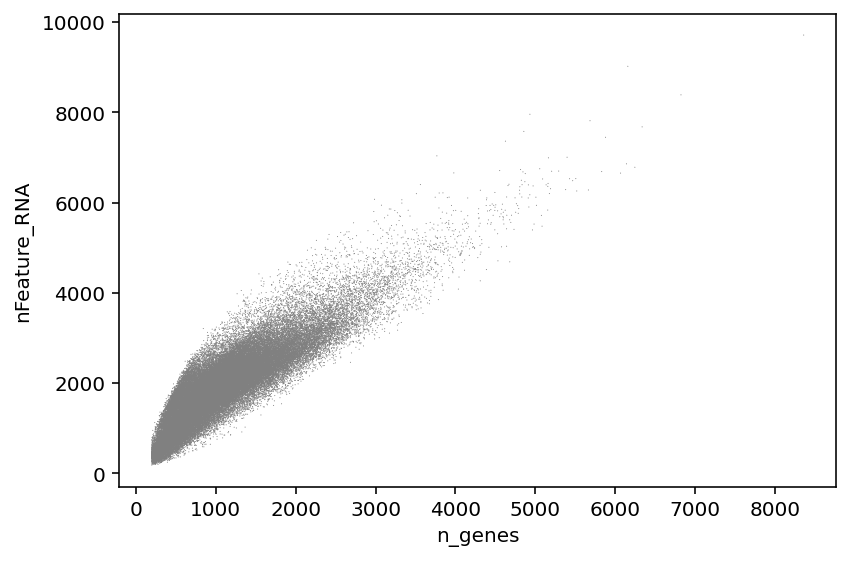

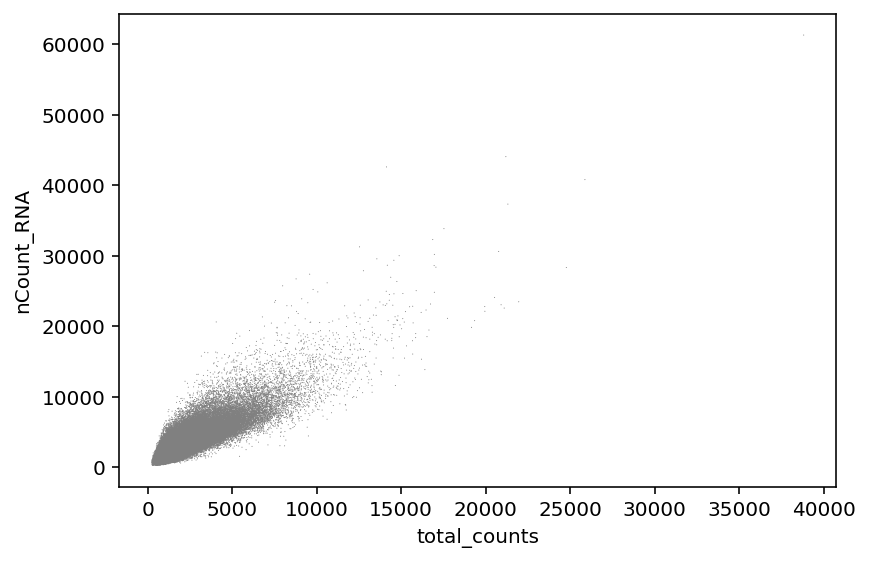

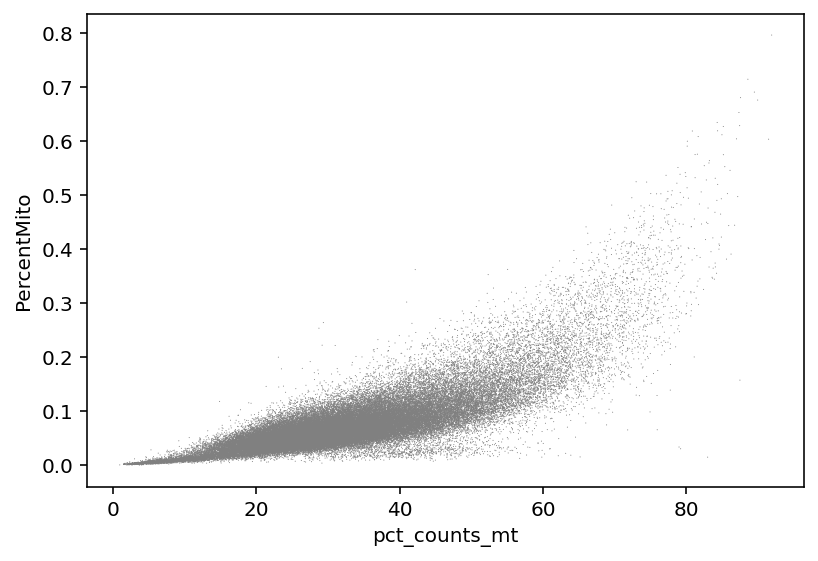

In [47]:
# Scatters to compare with Chris's pipeline
sc.pl.scatter(adata, x='n_genes', y='nFeature_RNA')
sc.pl.scatter(adata, x='total_counts', y='nCount_RNA')
sc.pl.scatter(adata, x='pct_counts_mt', y='PercentMito')

## Doublet detection
Use scrublet to perform doublet detection. Takes around 5 minutes to run on this dataset. I let scrublet decide on a doublet score threshold here.

In [49]:
# Run the doublet detection algorithm from scrublet
sce.pp.scrublet(
    adata,
    adata_sim=None,
    random_state=random_state
)

Running Scrublet
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
Automatically set threshold at doublet score = 0.14
Detected doublet rate = 13.6%
Estimated detectable doublet fraction = 49.7%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 27.4%
    Scrublet finished (0:05:47)


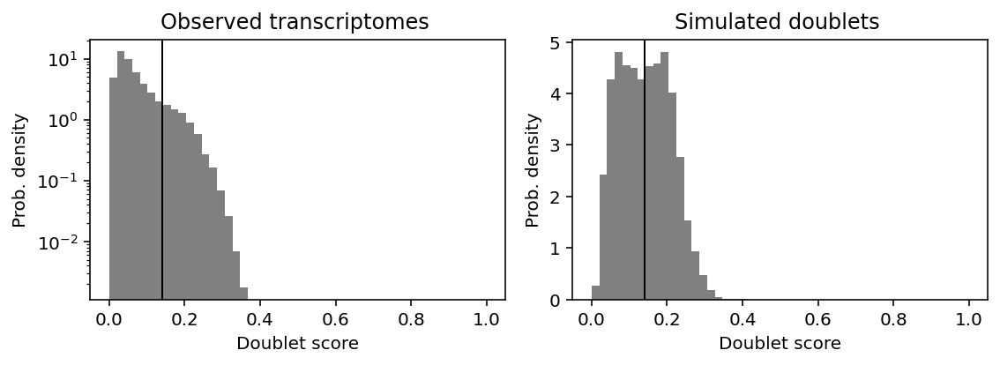

In [50]:
# Plot the doublet score distribution against simulated cells
sce.pl.scrublet_score_distribution(adata)

# Filtering
Actually filter cells based on QC

In [55]:
# Generates a nice interactive filtering plot to play with thresholds and see how that effects cells passing QC
def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
                value = '{:.1f}'.format(p.get_height())
                ax.text(_x, _y, value, ha="center")
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height() - (p.get_height()*0.5)
                value = '{:.1f}'.format(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)
        
def h(lo_counts=500, hi_counts=20000, genes=300, mito=25, doublet_score=0.2):
    conditions = [
        (adata.obs['doublet_score'] > doublet_score),
        (adata.obs['total_counts'] < lo_counts),
        (adata.obs['total_counts'] > hi_counts),
        (adata.obs['n_genes'] < genes),
        (adata.obs['pct_counts_mt'] > mito),
        ((adata.obs['doublet_score'] <= doublet_score) & (adata.obs['total_counts'] >= lo_counts) & (adata.obs['total_counts'] <= hi_counts) & (adata.obs['n_genes'] >= genes) & adata.obs['pct_counts_mt'] <= mito)
    ]
    values = ['Doublet', 'Low_nFeature', 'High_nFeature', 'Low_ngenes', 'High_MT', 'Passing']
    adata.obs['QC'] = np.select(conditions, values)
    adata.obs['QC'] = adata.obs['QC'].astype('category')
    new_df1 = pd.DataFrame(adata.obs['QC'].value_counts()).reset_index()
    p = sns.barplot(x='index', y='QC', data=new_df1, color='sandybrown')
    show_values(p)

interactive_plot = interactive(h, lo_counts=(0, 2000, 20), hi_counts=(0, 50000, 200), genes=(0, 2000,20), mito=(0, 100, 1), doublet_score=(0, 1, 0.01))
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(IntSlider(value=500, description='lo_counts', max=2000, step=20), IntSlider(value=20000,…

In [56]:
# Check the numbers of cells filtered out by the above function
adata.obs["QC"].value_counts()

High_MT          66686
Passing          21842
Doublet          15240
Low_ngenes        5290
Low_nFeature      3059
High_nFeature       11
Name: QC, dtype: int64

In [57]:
# Check how many cells from Chris's metadata pass
adata.obs[adata.obs["sample"].isna()].value_counts("QC")

QC
High_MT          18536
Doublet          11935
Low_ngenes        4178
Passing           3812
Low_nFeature      1995
High_nFeature       11
dtype: int64

In [58]:
# Now actually filter the data based on the QC metrics
adata_filtered = adata[adata.obs['QC'] == 'Passing']
adata_filtered

View of AnnData object with n_obs × n_vars = 21842 × 31128
    obs: 'n_genes', 'total_counts_combinomics', 'duplicate_counts_combinomics', 'umis_combinomics', 'genes_combinomics', 'percent_mitochondrial_combinomics', 'lane', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.25', 'seurat_clusters', 'PercentMito', 'lane_processded_metadata', 'MULTI', 'RNA_snn_res.1', 'RNA_snn_res.0.5', 'sample', 'temp', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'QC'
    var: 'gene_ids', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'n_cells-4', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'scrublet'

In [59]:
# Only using cells that Chris kept for now
adata_filtered = adata_filtered[~adata_filtered.obs["sample"].isna()]

In [60]:
# How many cells remain
adata_filtered

View of AnnData object with n_obs × n_vars = 18030 × 31128
    obs: 'n_genes', 'total_counts_combinomics', 'duplicate_counts_combinomics', 'umis_combinomics', 'genes_combinomics', 'percent_mitochondrial_combinomics', 'lane', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.25', 'seurat_clusters', 'PercentMito', 'lane_processded_metadata', 'MULTI', 'RNA_snn_res.1', 'RNA_snn_res.0.5', 'sample', 'temp', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'QC'
    var: 'gene_ids', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'n_cells-4', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'scrublet'

In [76]:
import sys
sys.path.append("/cellar/users/aklie/data/igvf/scripts")
from downsample import stratified_downsample
def stratified_downsample(
    adata, 
    group_by, 
    target_cells_per_group=1000
):
    """Downsample adata to target_cells per group in group_by.

    Parameters
    ----------
    adata : AnnData
        Annotated data matrix
    group_by : str
        Key for observation grouping
    target_cells_per_group : int, optional
        Target number of cells per group, by default 1000

    Returns
    -------
    AnnData
        Downsampled AnnData
    """
    adatas = [adata[adata.obs[group_by] == clust] for clust in adata.obs[group_by].cat.categories]
    for dat in adatas:
        if dat.n_obs > target_cells_per_group:
            sc.pp.subsample(dat, n_obs=target_cells_per_group)
    adata_downsampled = sc.AnnData.concatenate(*adatas)
    return adata_downsampled

In [78]:
adata_filtered = stratified_downsample(adata_filtered, group_by="sample", target_cells_per_group=1000)
adata_filtered

/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


AnnData object with n_obs × n_vars = 7000 × 31128
    obs: 'n_genes', 'total_counts_combinomics', 'duplicate_counts_combinomics', 'umis_combinomics', 'genes_combinomics', 'percent_mitochondrial_combinomics', 'lane', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.25', 'seurat_clusters', 'PercentMito', 'lane_processded_metadata', 'MULTI', 'RNA_snn_res.1', 'RNA_snn_res.0.5', 'sample', 'temp', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'QC', 'batch'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'n_cells-4'

In [80]:
adata_filtered.obs["sample"].value_counts()

S1         1000
S3         1000
S4         1000
S5_2D      1000
S5_2D3D    1000
S6_2D      1000
S6_2D3D    1000
Name: sample, dtype: int64

# Normalization

In [81]:
# Keep raw cont data before log transformation
adata_filtered.raw = adata_filtered
adata_filtered.layers["raw_counts"] = adata_filtered.raw.X.copy()

In [82]:
# Normalize gene expression matrix with total UMI count per cell
sc.pp.normalize_total(adata_filtered, target_sum=1e4)
sc.pp.log1p(adata_filtered)

normalizing counts per cell
    finished (0:00:00)


In [83]:
adata_filtered.layers["log_normalized_counts"] = adata_filtered.X

In [84]:
adata_filtered.X[:10, :10].todense()

matrix([[0.       , 0.       , 0.       , 0.       , 0.       ,
         0.       , 0.       , 0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       , 0.       , 0.       ,
         0.       , 0.       , 0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       , 0.       , 1.2744281,
         0.       , 0.       , 0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       , 0.       , 1.3124266,
         0.       , 0.       , 0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       , 0.       , 0.       ,
         0.       , 0.       , 0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       , 0.       , 0.       ,
         0.       , 0.       , 0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       , 0.       , 0.       ,
         0.       , 0.       , 0.       , 0.       , 0.       ],
        [0.       , 0.       , 0.       , 0.       , 0.       ,
         0.       , 0.       , 0.

# Cell cycle scoring

In [85]:
# From Regev paper, wonder if this needs updating
s_genes = ['MCM5','PCNA','TYMS','FEN1','MCM7','MCM4','RRM1','UNG','GINS2','MCM6','CDCA7','DTL','PRIM1',
           'UHRF1','CENPU','HELLS','RFC2','POLR1B','NASP','RAD51AP1','GMNN','WDR76','SLBP','CCNE2','UBR7',
           'POLD3','MSH2','ATAD2','RAD51','RRM2','CDC45','CDC6','EXO1','TIPIN','DSCC1','BLM','CASP8AP2',
           'USP1','CLSPN','POLA1','CHAF1B','MRPL36','E2F8']
g2m_genes = ['HMGB2','CDK1','NUSAP1','UBE2C','BIRC5','TPX2','TOP2A','NDC80','CKS2','NUF2','CKS1B',
             'MKI67','TMPO','CENPF','TACC3','PIMREG','SMC4','CCNB2','CKAP2L','CKAP2','AURKB','BUB1',
             'KIF11','ANP32E','TUBB4B','GTSE1','KIF20B','HJURP','CDCA3','JPT1','CDC20','TTK','CDC25C',
             'KIF2C','RANGAP1','NCAPD2','DLGAP5','CDCA2','CDCA8','ECT2','KIF23','HMMR','AURKA','PSRC1',
             'ANLN','LBR','CKAP5','CENPE','CTCF','NEK2','G2E3','GAS2L3','CBX5','CENPA']
cell_cycle_genes = s_genes + g2m_genes
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
len(cell_cycle_genes)

97

In [86]:
# Score cells based on these genes, might be useful later
sc.tl.score_genes_cell_cycle(adata_filtered, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    427 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    471 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


# Highly variable genes

In [87]:
# Select top 3000 highly-variable genes
sc.pp.highly_variable_genes(adata_filtered, flavor='seurat_v3', n_top_genes=3000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


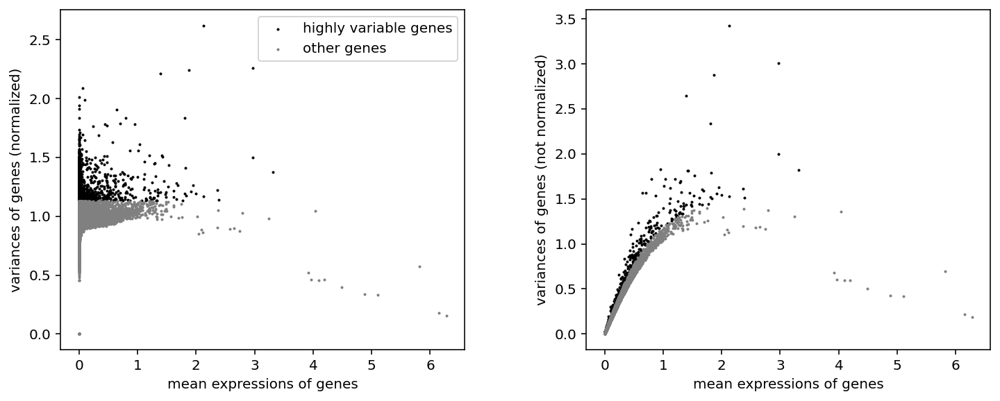

In [115]:
sc.pl.highly_variable_genes(adata_filtered)

In [89]:
# Subset the genes
adata_variable = adata_filtered[:, adata_filtered.var['highly_variable']]

In [91]:
# Check it
adata_variable

View of AnnData object with n_obs × n_vars = 7000 × 3000
    obs: 'n_genes', 'total_counts_combinomics', 'duplicate_counts_combinomics', 'umis_combinomics', 'genes_combinomics', 'percent_mitochondrial_combinomics', 'lane', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.25', 'seurat_clusters', 'PercentMito', 'lane_processded_metadata', 'MULTI', 'RNA_snn_res.1', 'RNA_snn_res.0.5', 'sample', 'temp', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'QC', 'batch', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells-1', 'n_cells-2', 'n_cells-3', 'n_cells-4', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg'
    layers: 'raw_counts', 'log_normalized_counts'

# PCA

In [92]:
# Not sure if this is a good thing to do, see it sometimes and not others (PCA auto centers)
sc.pp.scale(adata_variable, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [93]:
# PCA
sc.tl.pca(adata_variable, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


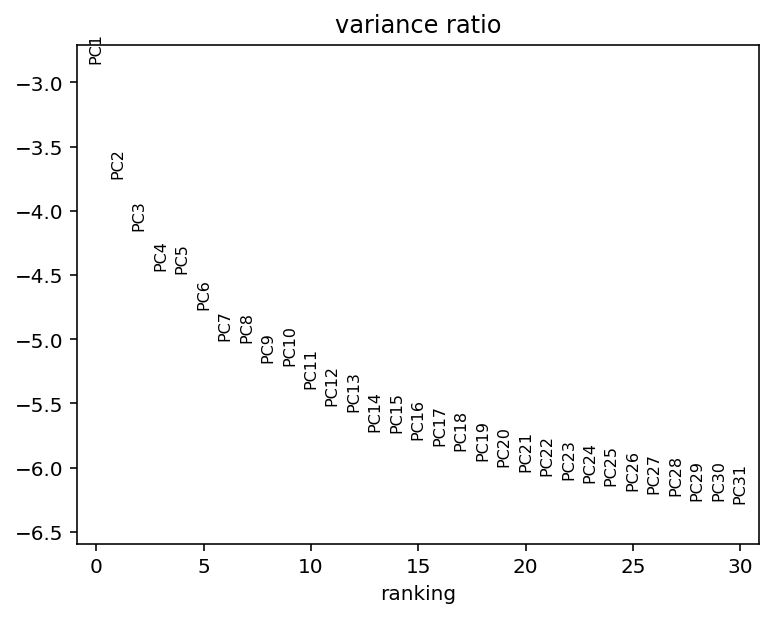

In [94]:
# Check the variance explained by each pc, on log scale
sc.pl.pca_variance_ratio(adata_variable, log=True)

In [99]:
adata_variable.obs['log_counts'] = np.log(adata_variable.obs['total_counts'])

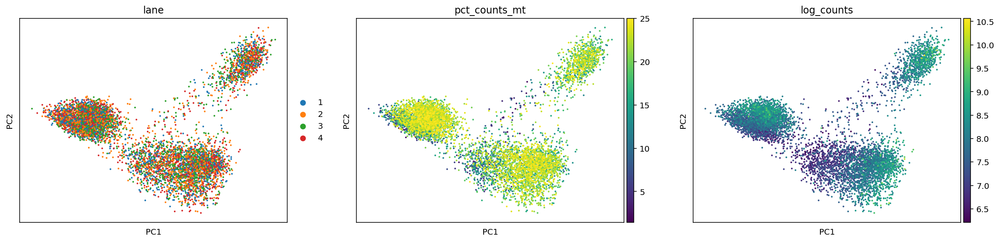

In [100]:
# Check technical covariates across first 2 PCs
sc.pl.pca(adata_variable, color = ['lane', "pct_counts_mt", "log_counts"])

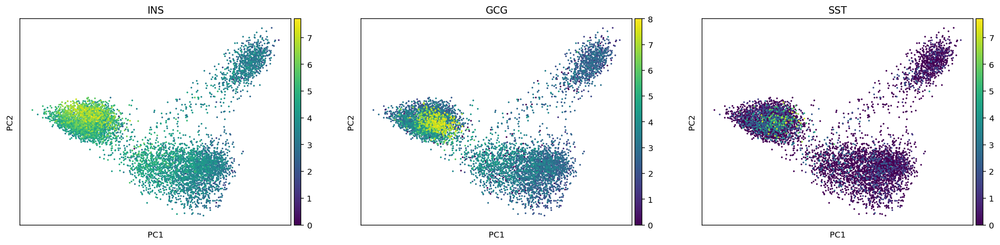

In [101]:
# Check for pancreatic islet cell markers
sc.pl.pca(adata_variable, color = ["INS", "GCG", "SST"])

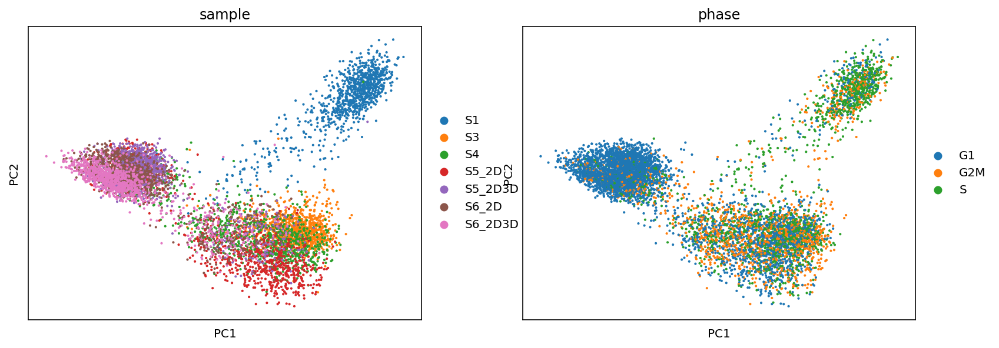

In [102]:
# Check for variance in biological covariates
sc.pl.pca(adata_variable, color = ["sample", "phase"])

# UMAP

In [103]:
# Find neighbors
sc.pp.neighbors(adata_variable)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)


In [104]:
# Calculate UMAP dimensionality reduction
sc.tl.umap(adata_variable)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


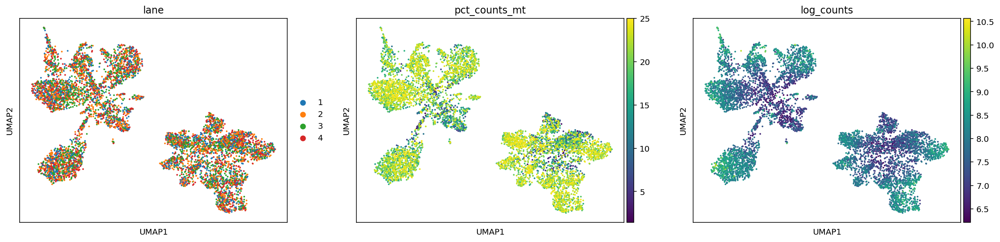

In [105]:
# Check technical covariates
sc.pl.umap(adata_variable, color = ['lane', "pct_counts_mt", "log_counts"])

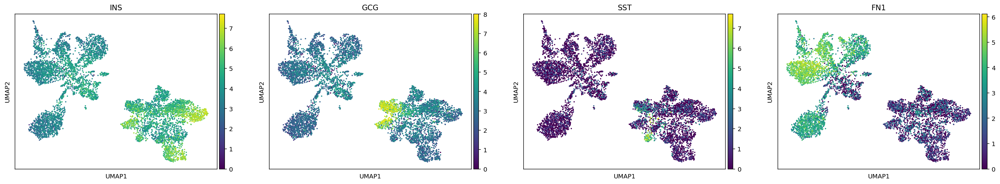

In [112]:
# Markers
sc.pl.umap(adata_variable, color = ["INS", "GCG", "SST", "FN1"], use_raw=True)

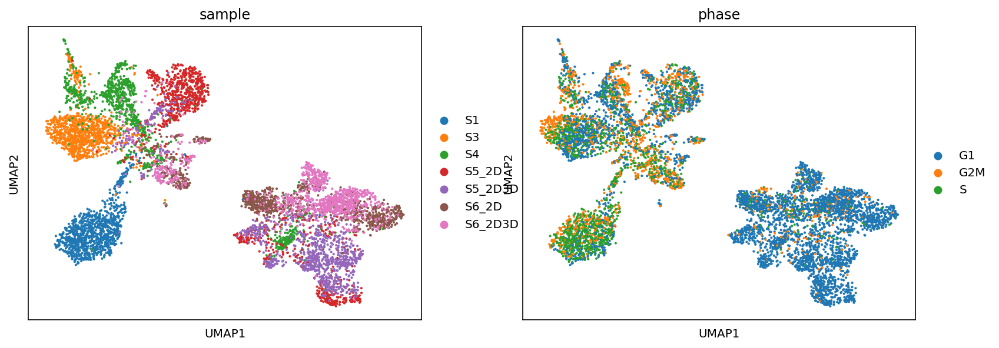

In [108]:
# Biological covariates
sc.pl.umap(adata_variable, color = ["sample", "phase"])

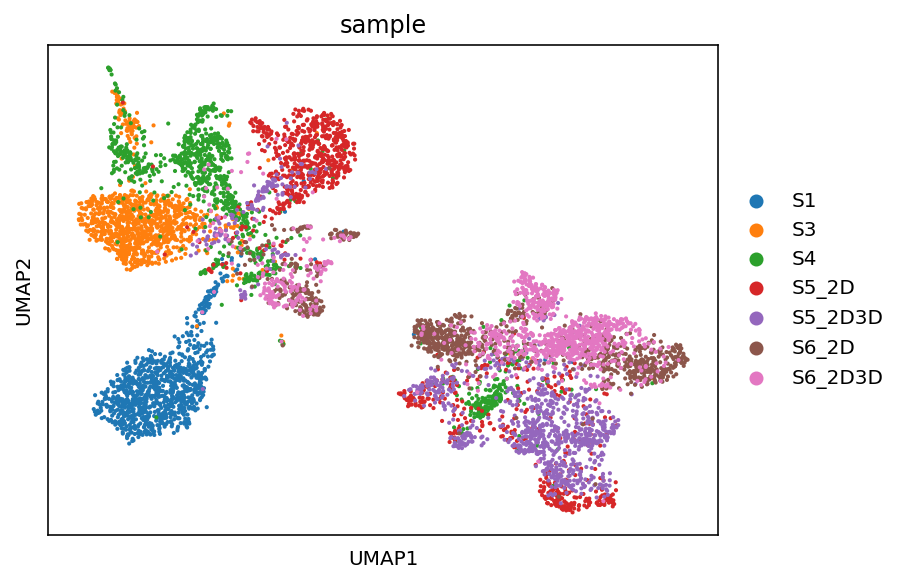

In [109]:
# Biological covariates
sc.pl.umap(adata_variable, color = "sample")

# Clustering

In [125]:
# Cell clustering
sc.tl.leiden(adata_variable, random_state=13, resolution=1, key_added='leiden_r1')

running Leiden clustering
    finished: found 20 clusters and added
    'leiden_r1', the cluster labels (adata.obs, categorical) (0:00:03)


In [127]:
sc.tl.leiden(adata_variable, random_state=13, resolution=0.8, key_added='leiden_r0.8')
sc.tl.leiden(adata_variable, random_state=13, resolution=0.5, key_added='leiden_r0.5')
sc.tl.leiden(adata_variable, random_state=13, resolution=0.4, key_added='leiden_r0.4')
sc.tl.leiden(adata_variable, random_state=13, resolution=0.3, key_added='leiden_r0.3')
sc.tl.leiden(adata_variable, random_state=13, resolution=0.2, key_added='leiden_r0.2')
sc.tl.leiden(adata_variable, random_state=13, resolution=0.1, key_added='leiden_r0.1')
sc.tl.leiden(adata_variable, random_state=13, resolution=0.05, key_added='leiden_r0.05')

running Leiden clustering
    finished: found 19 clusters and added
    'leiden_r0.8', the cluster labels (adata.obs, categorical) (0:00:03)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_r0.5', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_r0.4', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_r0.3', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_r0.2', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_r0.1', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden_r0.05', the cluster labels (adata.obs, categorical) (0:00:01)


In [135]:
pd.crosstab(adata_variable.obs['sample'], adata_variable.obs['leiden_r0.1'])

leiden_r0.1,0,1,2,3
sample,,,,
S1,3,75,920,2
S3,4,980,1,15
S4,217,663,1,119
S5_2D,396,581,0,23
S5_2D3D,853,116,1,30
S6_2D,789,7,0,204
S6_2D3D,820,36,0,144


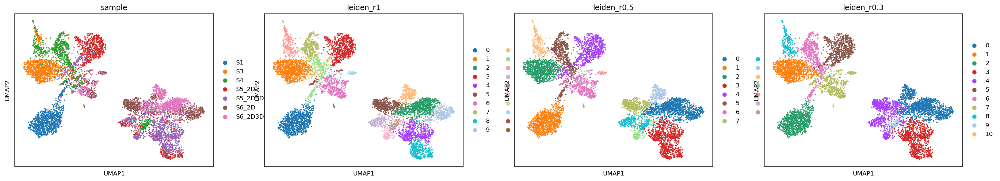

In [138]:
sc.pl.umap(adata_variable, color=['sample', 'leiden_r1', 'leiden_r0.5', 'leiden_r0.3'])

In [142]:
# We can run PAGA on the leiden 0.5 resolution clustering to get at better connected clusters
sc.tl.paga(adata_variable, groups='leiden_r0.5')
sc.pl.paga(adata_variable, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata_variable, init_pos='paga')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


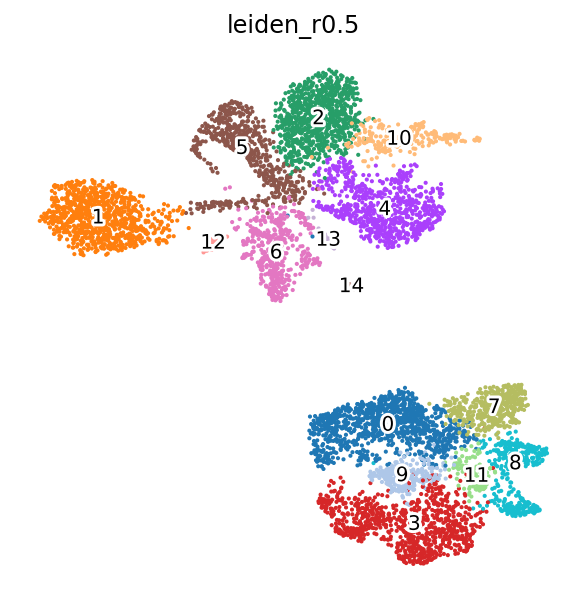

In [145]:
# Save the clustering results for leiden 0.5 resolution clustering
plt.rcParams['figure.figsize'] = (5,5)
sc.pl.umap(adata_variable, color=['leiden_r0.5'], ncols=3, legend_loc='on data', legend_fontoutline=3, legend_fontweight='normal', frameon=False)

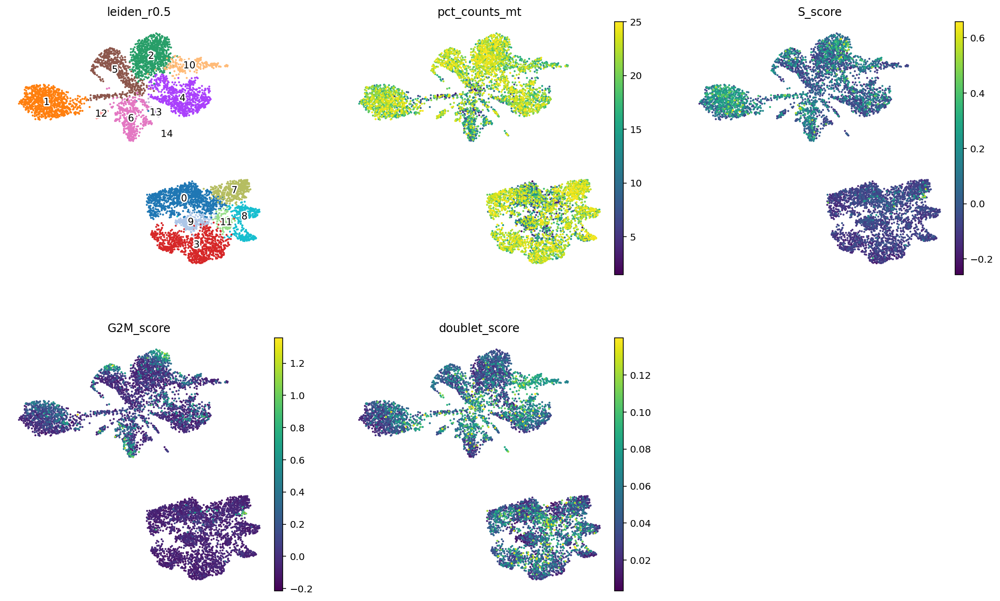

In [146]:
# Finally plot the UMAP with many of the annotations we have added to this point
plt.rcParams['figure.figsize'] = (5,5)
sc.pl.umap(
    adata_variable, 
    color=['leiden_r0.5','pct_counts_mt','S_score', 'G2M_score', 'doublet_score'],
    ncols=3, 
    legend_loc='on data', 
    legend_fontoutline=3, 
    legend_fontweight='normal', 
    frameon=False, 
)

# Marker gene analysis

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


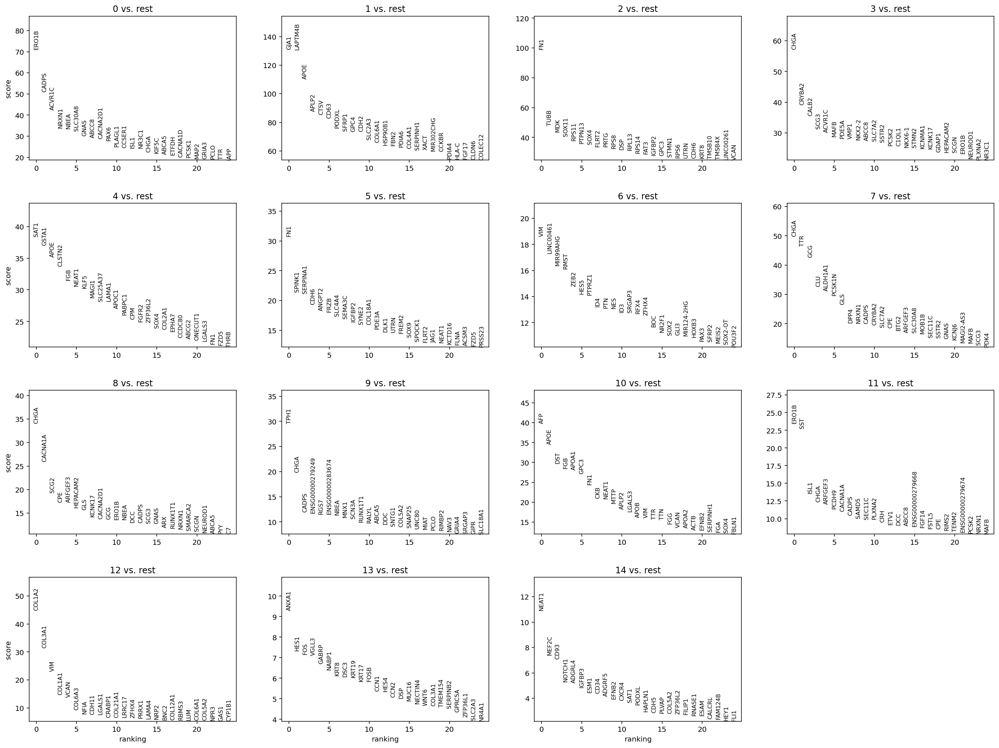

In [139]:
sc.tl.rank_genes_groups(adata_variable, 'leiden_r0.5', method='t-test', n_genes=adata_variable.shape[1], use_raw=False, layer="log_normalized_counts")
sc.pl.rank_genes_groups(adata_variable, n_genes=25, sharey=False)

In [140]:
# Our last plot, another way of looking at marker genes!
markers = pd.DataFrame(adata_variable.uns['rank_genes_groups']['names']).head(3)

# Define marker genes
marker_genes = []
for cluster in markers.columns:
    marker_genes += list(markers[cluster].values)


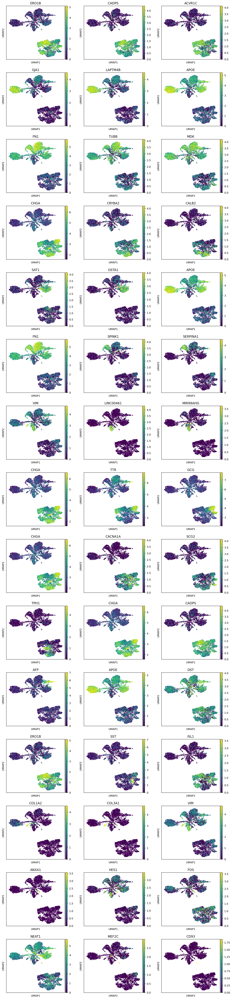

In [150]:
# We can replot the UMAP with several known markers for te PBMC cell types
plt.rcParams['figure.figsize'] = (4,4) #rescale figures
sc.pl.umap(
    adata=adata_variable, 
    color=marker_genes,
    vmin='p20', 
    vmax='p99.9', 
    ncols=3,
    legend_loc='on data', 
    legend_fontoutline=3, 
    legend_fontweight='normal', 
    use_raw=False,
    layer="log_normalized_counts", 
)

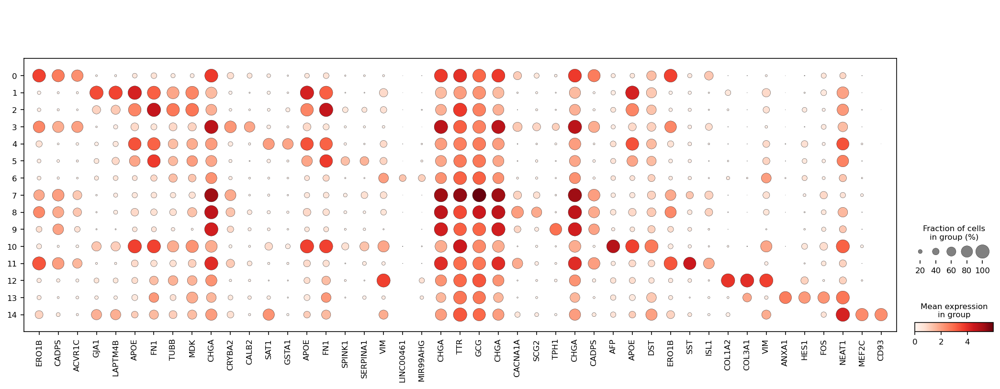

In [141]:
sc.pl.dotplot(
    adata_variable,
    var_names=marker_genes,
    groupby="leiden_r0.5",
    use_raw=False,
    layer="log_normalized_counts"
)

# Cluster annotation

# DONE!


---

# Scratch